### **Binary Classification with a Bank Churn Dataset - Playground Series - Season 4, Episode 1 - Data Analysis**

#### **1. About Dataset**

**Columns Description:**

- **Customer ID**: A unique identifier for each customer
- **Surname**: The customer's surname or last name
- **Credit Score**: A numerical value representing the customer's credit score
- **Geography**: The country where the customer resides (France, Spain or Germany)
- **Gender**: The customer's gender (Male or Female)
- **Age**: The customer's age
- **Tenure**: The number of years the customer has been with the bank
- **Balance**: The customer's account balance
- **NumOfProducts**: The number of bank products the customer uses (e.g., savings account, credit card)
- **HasCrCard**: Whether the customer has a credit card (1 = yes, 0 = no)
- **IsActiveMember**: Whether the customer is an active member (1 = yes, 0 = no)
- **EstimatedSalary**: The estimated salary of the customer
- **Exited**: Whether the customer has churned (1 = yes, 0 = no)


#### **2. Importing the Libraries**

In [4]:
# Import libraries

# To handle the data
import pandas as pd
import numpy as np

# To visualize the dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# This is for jupyter notebook to show the plot in the notebook itself instead of opening a new window
%matplotlib inline

# To preprocess the data
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler

#### **3. Basic Explorations**

*At the beginning of the code blocks containing the written codes, the following subheadings will be specified.*

- **3.1 Loading the Dataset**
- **3.2 Quick Overview**
- **3.3 Shape of Datasets**
- **3.4 Null Values in Datasets**
- **3.5 Duplicates Values in Datasets**

In [6]:
# 3.1 Loading the Dataset

# Load Submission Data 
df_submission = pd.read_csv('sample_submission.csv')

# Load test Data 
df_test = pd.read_csv('test.csv')

# Load Train Dataset and show head of Data 
# Train Data 
df_train = pd.read_csv('train.csv')

In [7]:
# Making a Copy of the Test Data for Future Use 
df_test = pd.read_csv('test.csv')
df_test_ov = df_test.copy()
df_test.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,165034,15773898,Lucchese,586,France,Female,23.0,2,0.00,2,0.0,1.0,160976.75
1,165035,15782418,Nott,683,France,Female,46.0,2,0.00,1,1.0,0.0,72549.27
2,165036,15807120,K?,656,France,Female,34.0,7,0.00,2,1.0,0.0,138882.09
3,165037,15808905,O'Donnell,681,France,Male,36.0,8,0.00,1,1.0,0.0,113931.57
4,165038,15607314,Higgins,752,Germany,Male,38.0,10,121263.62,1,1.0,0.0,139431.00


In [8]:
# For Displaying Maximum Columns
pd.set_option('display.max_columns', None) 

In [9]:
# 3.2 Quick Overview

df_train.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [10]:
df_test.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,165034,15773898,Lucchese,586,France,Female,23.0,2,0.00,2,0.0,1.0,160976.75
1,165035,15782418,Nott,683,France,Female,46.0,2,0.00,1,1.0,0.0,72549.27
2,165036,15807120,K?,656,France,Female,34.0,7,0.00,2,1.0,0.0,138882.09
3,165037,15808905,O'Donnell,681,France,Male,36.0,8,0.00,1,1.0,0.0,113931.57
4,165038,15607314,Higgins,752,Germany,Male,38.0,10,121263.62,1,1.0,0.0,139431.00


In [11]:
df_submission.head()

,id,Exited
0,165034,0.5
1,165035,0.5
2,165036,0.5
3,165037,0.5
4,165038,0.5


In [12]:
# 3.3 Shape of Datasets

# Checking the number of rows and columns

num_train_rows, num_train_columns = df_train.shape

num_test_rows, num_test_columns = df_test.shape

num_submission_rows, num_submission_columns = df_submission.shape

print("Training Data:")
print(f"Number of Rows: {num_train_rows}")
print(f"Number of Columns: {num_train_columns}\n")

print("Test Data:")
print(f"Number of Rows: {num_test_rows}")
print(f"Number of Columns: {num_test_columns}\n")

print("Submission Data:")
print(f"Number of Rows: {num_submission_rows}")
print(f"Number of Columns: {num_submission_columns}")

Training Data:
Number of Rows: 165034
Number of Columns: 14

Test Data:
Number of Rows: 110023
Number of Columns: 13

Submission Data:
Number of Rows: 110023
Number of Columns: 2


In [13]:
# 3.4 Null Values in Datasets

# Null Values in Train 
train_null = df_train.isnull().sum().sum()

# Null Count in Test 
test_null = df_test.isnull().sum().sum()

# Null Count in Submission
submission_null = df_submission.isnull().sum().sum()

print(f'Null Count in Train: {train_null}')
print(f'Null Count in Test: {test_null}')
print(f'Null Count in Submission: {submission_null}')

Null Count in Train: 0
Null Count in Test: 0
Null Count in Submission: 0


In [14]:
# 3.5 Duplicates Values in Datasets

# Count duplicate rows in train_data
train_duplicates = df_train.duplicated().sum()

# Count duplicate rows in test_data
test_duplicates = df_test.duplicated().sum()

# Count duplicate rows in original_data
submission_duplicates = df_submission.duplicated().sum()

# Print the results
print(f"Number of duplicate rows in train_data: {train_duplicates}")
print(f"Number of duplicate rows in test_data: {test_duplicates}")
print(f"Number of duplicate rows in test_data: {submission_duplicates}")

Number of duplicate rows in train_data: 0
Number of duplicate rows in test_data: 0
Number of duplicate rows in test_data: 0


#### 4. Exploring the Train Dataset

*At the beginning of the code blocks containing the written codes, the following subheadings will be specified.*

- **4.1 Rows and Columns**
- **4.2 Data Summary**

In [16]:
# 4.1 Rows and Columns

# Checking the number of rows and columns
num_train_rows, num_train_columns = df_train.shape

print("Training Data:")
print(f"Number of Rows: {num_train_rows}")
print(f"Number of Columns: {num_train_columns}\n")

Training Data:
Number of Rows: 165034
Number of Columns: 14



In [17]:
# 4.2 Data Summary

df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


- **4.2.1. Observation No 1**

  - They are 165034 rows and 14 columns in the dataset.
  - The columns having float datatypes are 5, integer datatype are 6, object datatype are 3.
  - The data does not contain any missing values.
  - The target variable in the dataset is Exited.

#### 5. Descriptive Analysis

*At the beginning of the code blocks containing the written codes, the following subheadings will be specified.*

- **5.1 Descriptive View of Data**

In [20]:
# 5.1 Descriptive View of Data

df_train.describe()

,id,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,165034.0000,1.650340e+05,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000
mean,82516.5000,1.569201e+07,656.454373,38.125888,5.020353,55478.086689,1.554455,0.753954,0.497770,112574.822734,0.211599
std,47641.3565,7.139782e+04,80.103340,8.867205,2.806159,62817.663278,0.547154,0.430707,0.499997,50292.865585,0.408443
min,0.0000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,41258.2500,1.563314e+07,597.000000,32.000000,3.000000,0.000000,1.000000,1.000000,0.000000,74637.570000,0.000000
50%,82516.5000,1.569017e+07,659.000000,37.000000,5.000000,0.000000,2.000000,1.000000,0.000000,117948.000000,0.000000
75%,123774.7500,1.575682e+07,710.000000,42.000000,7.000000,119939.517500,2.000000,1.000000,1.000000,155152.467500,0.000000
max,165033.0000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000


- **5.1.1 Observation No 2**

| **Category**            | **Description**                                                                                                                                                 |
|-------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Customer Demographics** | 1. The dataset contains information on 165,034 customers.<br>2. Customer IDs range from 0 to 165,033.                                                           |
| **Credit Score and Age**  | 1. The average credit score is approximately 656.45.<br>2. The average age is around 38.13 years.<br>3. Credit score ranges from 350 to 850.                    |
| **Financial Status**      | 1. Average balance is around 55,478.09, with a maximum up to 250,898.09.<br>2. Products per customer range from 1 to 4.                                           |
| **Bank Services**         | 1. 75.4% of customers have a credit card.<br>2. 75.4% of customers are active members.                                                                          |
| **Estimated Salary**      | 1. Average salary is 112,574.82.<br>2. Salaries vary from a minimum of 11.58 to a maximum of $199,992.48.                                                        |
| **Customer Churn**        | 1. 21.2% of customers have exited the bank.<br>2. 78.8% of customers remain with the bank.                                                                      |
| **Observations**          | 1. The dataset shows diverse customer behaviors.<br>2. Factors like age, tenure, and product usage influence churn.<br>3. Further analysis is required.         |


#### 6. Checking The Null And Duplicate Values

*At the beginning of the code blocks containing the written codes, the following subheadings will be specified.*

- **6.1 Null Values of Data**
- **6.2 Duplicates Values of Data**

In [23]:
# 6.1 Null Values of Data

# Null Values in Train 
train_null = df_train.isnull().sum().sum()
print(f'Null Count in Train: {train_null}')

Null Count in Train: 0


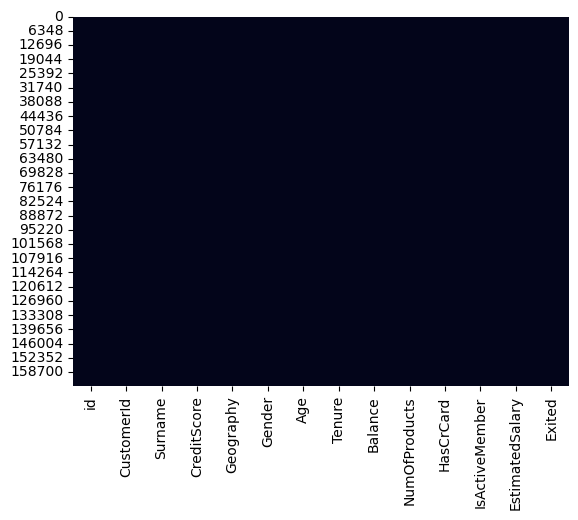

In [24]:
# Visual Proof 
sns.heatmap(df_train.isnull(), cbar=False)
plt.show()

In [25]:
# 6.2 Duplicates Values of Data

# Count duplicate rows in train_data
train_duplicates = df_train.duplicated().sum()

# Print the results
print(f"Number of duplicate rows in train_data: {train_duplicates}")

Number of duplicate rows in train_data: 0


<span style="color: green;">***Hence at this stage our dataset is pure from missing values and duplicated values***</span>.

#### 7. Lets Visualize the Data

*At the beginning of the code blocks containing the written codes, the following subheadings will be specified.*

- **7.1 Gender in The Dataset**
- **7.2 Geography in The Dataset**
- **7.3 Tenure in The Dataset**
- **7.4 Number Of Products in The Dataset**
- **7.5 Customer Having Credit Card in The Dataset**
- **7.6 Active Customers in The Dataset**
- **7.7 Exited in The Dataset**
- **7.8 Credit Score in The Dataset**
- **7.9 Age in The Dataset**
- **7.10 Balance in The Dataset**
- **7.11 Estimated Salary in The Dataset**
- **7.12 Countplot by Target**

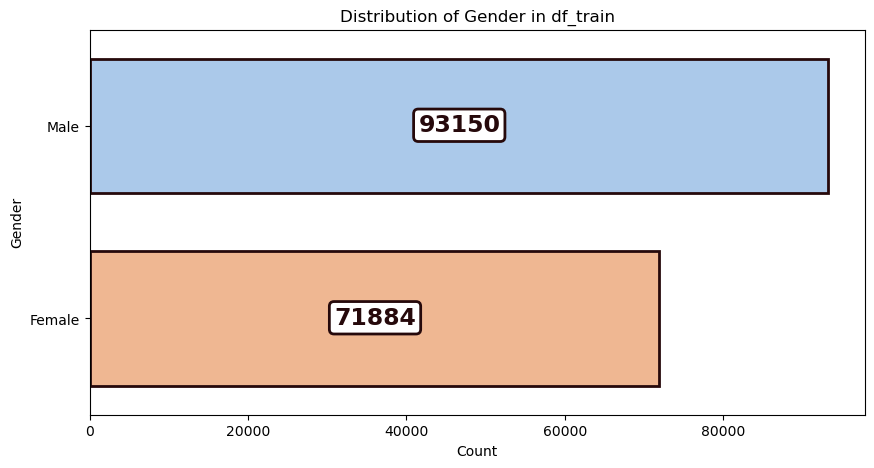

In [28]:
# 7.1 Gender in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['Gender'].nunique())  # Kategorilerle eşleşen renk sayısı
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="Gender", data=df_train, edgecolor='#26090b', linewidth=2, width=0.7, palette=palette, hue="Gender")

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="center", color='#26090b', fontsize=17, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 2, "alpha": 1})

plt.title("Distribution of Gender in df_train")
plt.xlabel("Count")
plt.ylabel("Gender")

plt.show()


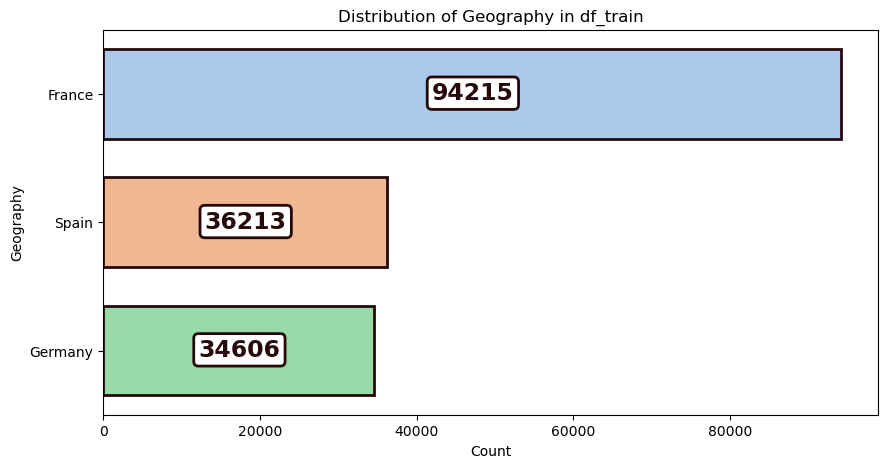

In [29]:
#7.2 Geography in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['Geography'].nunique())  # Kategorilerle eşleşen renk sayısı
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="Geography", data=df_train, palette=palette, edgecolor='#26090b', linewidth=2, width=0.7, hue="Geography", legend=False)

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="center", color='#26090b', fontsize=17, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 2, "alpha": 1})

plt.title("Distribution of Geography in df_train")
plt.xlabel("Count")
plt.ylabel("Geography")

plt.show()


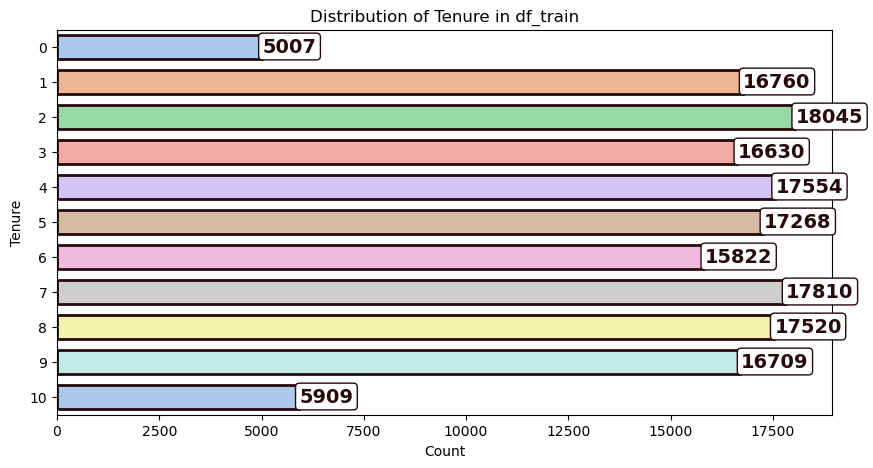

In [30]:
# 7.3 Tenure in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['Tenure'].nunique())  # Kategorilerle eşleşen renk sayısı
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="Tenure", data=df_train, palette=palette, edgecolor='#26090b', linewidth=2, width=0.7, hue="Tenure", legend=False)

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="edge", color='#26090b', fontsize=14, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 1, "alpha": 1})

plt.title("Distribution of Tenure in df_train")
plt.xlabel("Count")
plt.ylabel("Tenure")

plt.show()


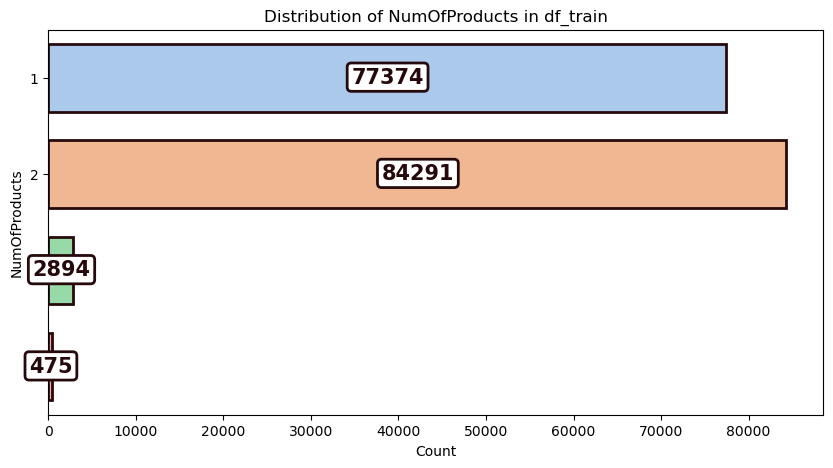

In [31]:
# 7.4 Number Of Products in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['NumOfProducts'].nunique())  # Kategorilerle eşleşen renk sayısı
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="NumOfProducts", data=df_train, palette=palette, edgecolor='#26090b', linewidth=2, width=0.7, hue="NumOfProducts", legend=False)

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="center", color='#26090b', fontsize=15, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 2, "alpha": 1})

plt.title("Distribution of NumOfProducts in df_train")
plt.xlabel("Count")
plt.ylabel("NumOfProducts")

plt.show()

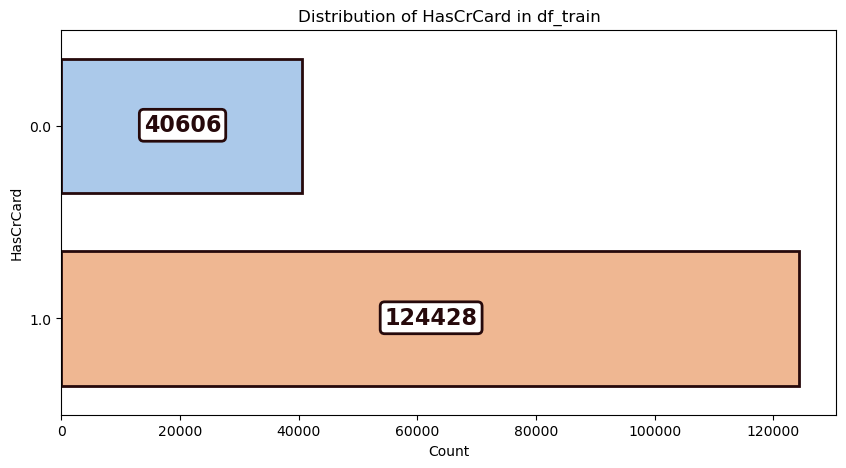

In [32]:
# 7.5 Customer Having Credit Card in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['HasCrCard'].nunique())  
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="HasCrCard", data=df_train, palette=palette, edgecolor='#26090b', linewidth=2, width=0.7, hue="HasCrCard", legend=False)

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="center", color="#26090b", fontsize=16, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 2, "alpha": 1})

plt.title("Distribution of HasCrCard in df_train")
plt.xlabel("Count")
plt.ylabel("HasCrCard")

plt.show()


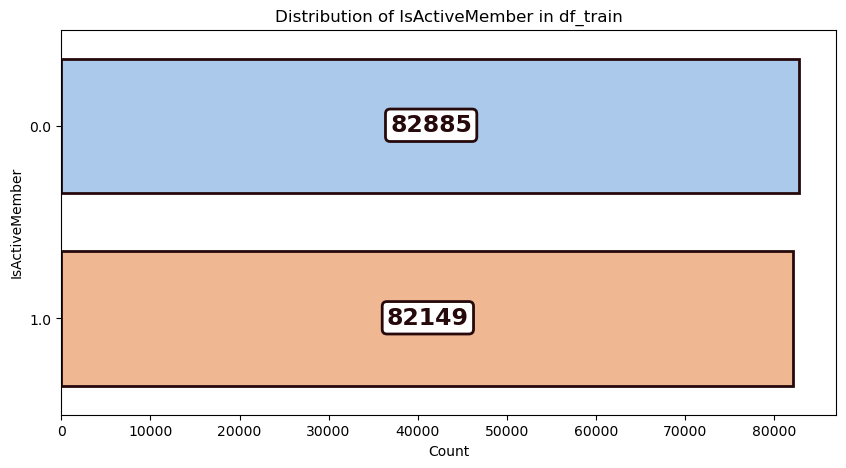

In [33]:
# 7.6 Active Customers in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['IsActiveMember'].nunique())  # Kategorilerle eşleşen renk sayısı
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="IsActiveMember", data=df_train, palette=palette, edgecolor='#26090b', linewidth=2, width=0.7, hue="IsActiveMember", legend=False)

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="center", color="#26090b", fontsize=17, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 2, "alpha": 1})

plt.title("Distribution of IsActiveMember in df_train")
plt.xlabel("Count")
plt.ylabel("IsActiveMember")

plt.show()


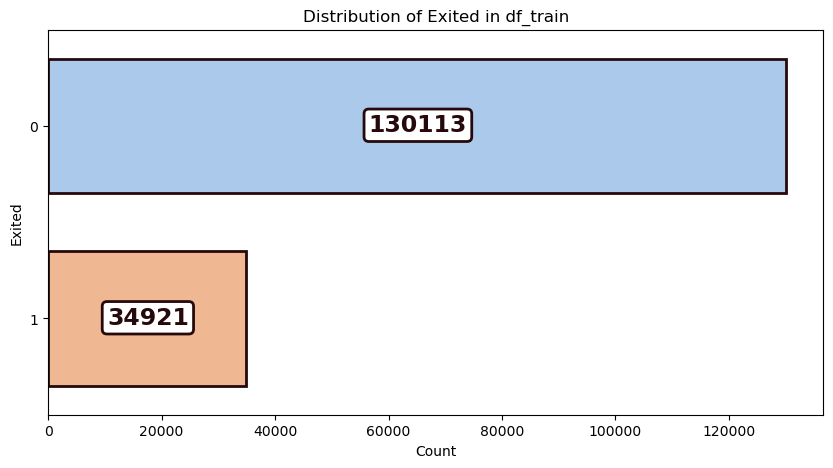

In [34]:
# 7.7 Exited in The Dataset

palette = sns.color_palette("pastel", n_colors=df_train['Exited'].nunique())  # Kategorilerle eşleşen renk sayısı
fig = plt.figure(figsize=(10, 5))

p = sns.countplot(y="Exited", data=df_train, palette=palette, edgecolor='#26090b', linewidth=2, width=0.7, hue="Exited", legend=False)

# Add text on top of the bars
for container in p.containers:
    plt.bar_label(container, label_type="center", color="#26090b", fontsize=17, weight='bold', padding=6, position=(0.5, 0.5),
                  bbox={"boxstyle": "round", "pad": 0.2, "facecolor": "white",  # Arka plan beyaz
                         "edgecolor": '#26090b', "linewidth": 2, "alpha": 1})

plt.title("Distribution of Exited in df_train")
plt.xlabel("Count")
plt.ylabel("Exited")

plt.show()


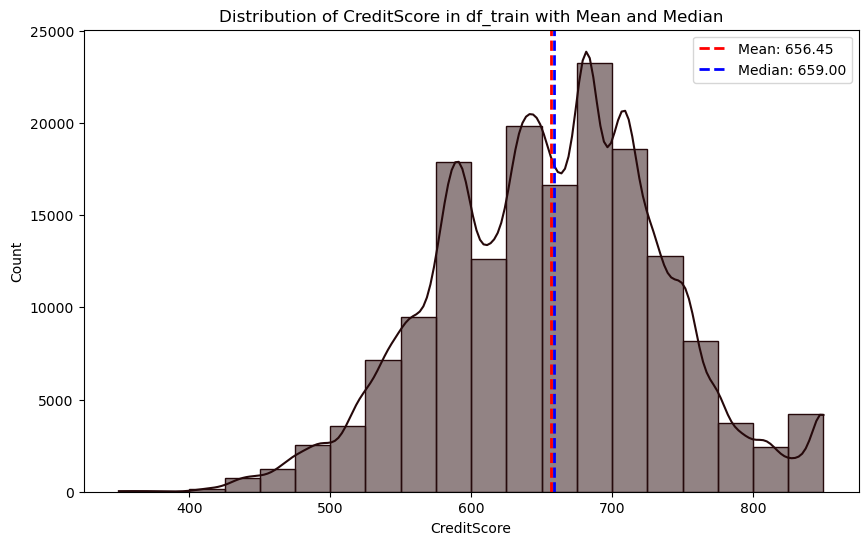

In [35]:
# 7.8 Credit Score in The Dataset

# Create a histogram for the "CreditScore" column with specified colors
fig = plt.figure(figsize=(10, 6))
histplot = sns.histplot(data=df_train, x="CreditScore", bins=20, color='#26090b', edgecolor='#26090b', kde=True)

# Set the color for the kernel density line
histplot.get_lines()[0].set_color('#26090b')

# Calculate mean and median
mean_value = df_train["CreditScore"].mean()
median_value = df_train["CreditScore"].median()

# Add mean and median lines
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')

# Set labels and title
plt.title("Distribution of CreditScore in df_train with Mean and Median")
plt.xlabel("CreditScore")
plt.ylabel("Count")

# Show legend
plt.legend()
plt.show()

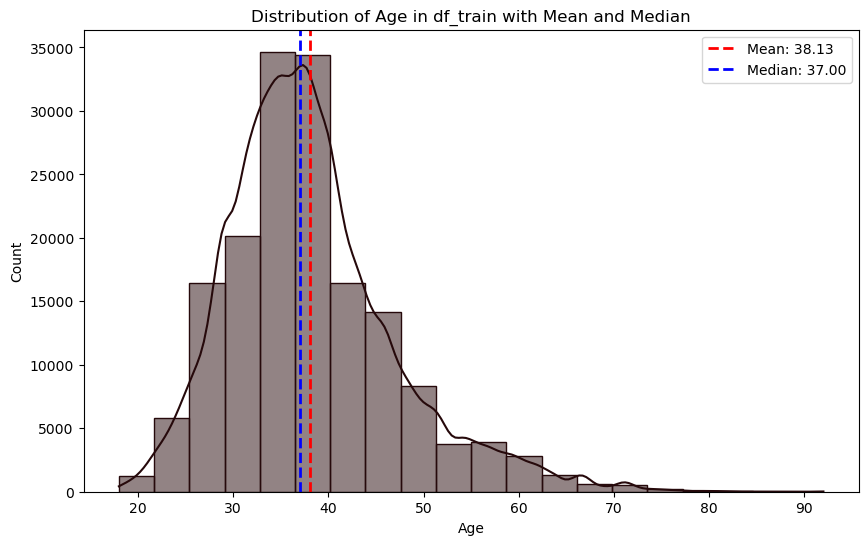

In [36]:
# 7.9 Age in The Dataset

# 7.8 The steps of the Credit Score graph in the Data Set are taken as an example.

fig = plt.figure(figsize=(10, 6))
histplot = sns.histplot(data=df_train, x="Age", bins=20, color='#26090b', edgecolor='#26090b', kde=True)

histplot.get_lines()[0].set_color('#26090b')

mean_value = df_train["Age"].mean()
median_value = df_train["Age"].median()

plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')

plt.title("Distribution of Age in df_train with Mean and Median")
plt.xlabel("Age")
plt.ylabel("Count")

plt.legend()

plt.show()


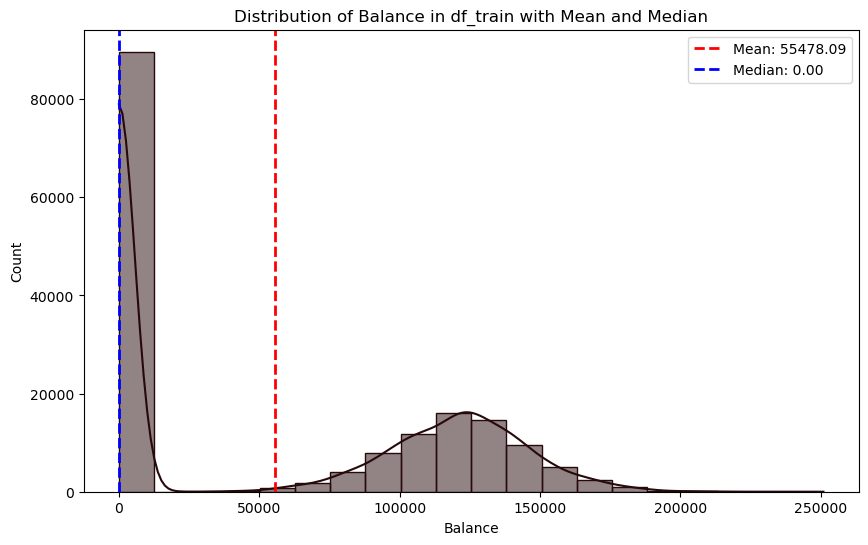

In [37]:
# 7.10 Balance in The Dataset

fig = plt.figure(figsize=(10, 6))

histplot = sns.histplot(data=df_train, x="Balance", bins=20, color='#26090b', edgecolor='#26090b', kde=True)

histplot.get_lines()[0].set_color('#26090b')

mean_value = df_train["Balance"].mean()
median_value = df_train["Balance"].median()

plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')

plt.title("Distribution of Balance in df_train with Mean and Median")
plt.xlabel("Balance")
plt.ylabel("Count")

plt.legend()
plt.show()

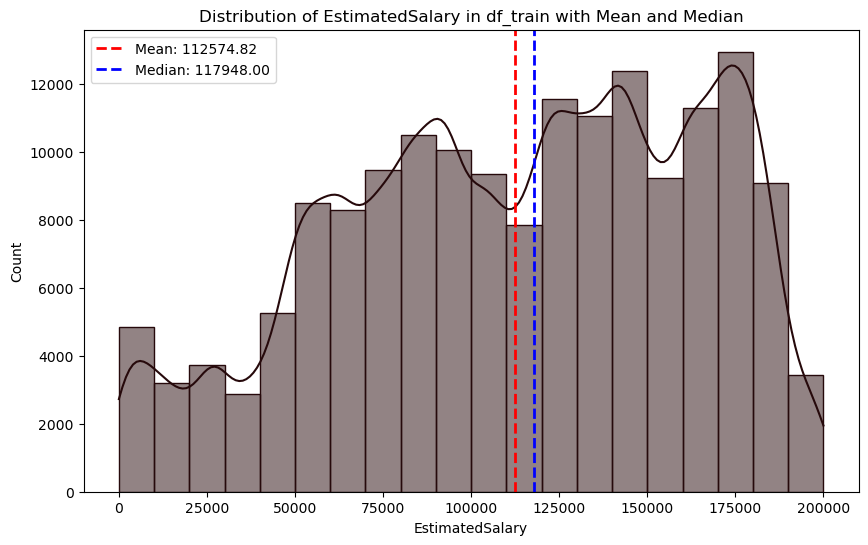

In [38]:
# 7.11 Estimated Salary in The Dataset

# 7.8 The steps of the Credit Score graph in the Data Set are taken as an example.

fig = plt.figure(figsize=(10, 6))

histplot = sns.histplot(data=df_train, x="EstimatedSalary", bins=20, color='#26090b', edgecolor='#26090b', kde=True)

histplot.get_lines()[0].set_color('#26090b')

mean_value = df_train["EstimatedSalary"].mean()
median_value = df_train["EstimatedSalary"].median()

plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_value:.2f}')
plt.axvline(median_value, color='blue', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')

plt.title("Distribution of EstimatedSalary in df_train with Mean and Median")
plt.xlabel("EstimatedSalary")
plt.ylabel("Count")

plt.legend()
plt.show()

In [39]:
# 7.12 Countplot by Target

cat_cols = ['Geography', 'Gender', 'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

num_cols = ['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

target = 'Exited'

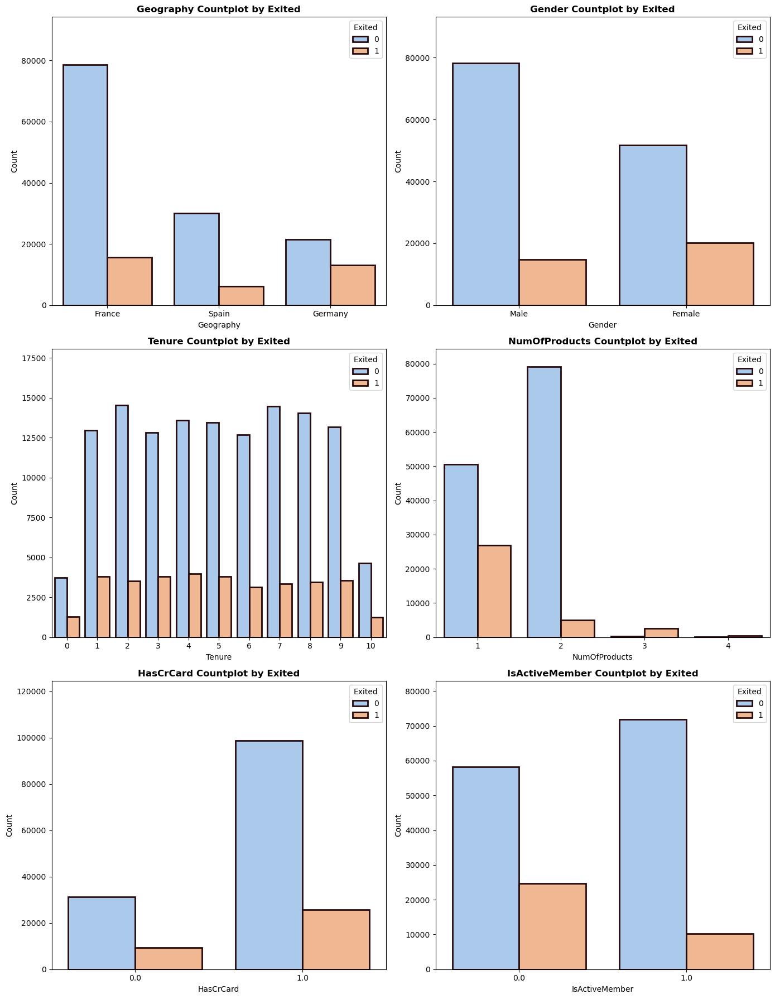

In [40]:
fig = plt.figure(figsize=(14, len(cat_cols) * 3))

for i, col in enumerate(cat_cols):
    plt.subplot(len(cat_cols) // 2 + len(cat_cols) % 2, 2, i + 1)
    
    sns.countplot(x=col, hue=target, data=df_train, palette=palette[0:2], 
                  edgecolor='#26090b', linewidth=2)
    
    plt.title(f"{col} Countplot by {target}", fontweight='bold')
    plt.ylim(0, df_train[col].value_counts().max() + 10)  # Y eksenini ayarlama
    plt.xlabel(col)  # X ekseninin etiketini ayarlama
    plt.ylabel('Count')  # Y ekseninin etiketini ayarlama

plt.tight_layout()
plt.show()


#### 8. Dealing with Outliers

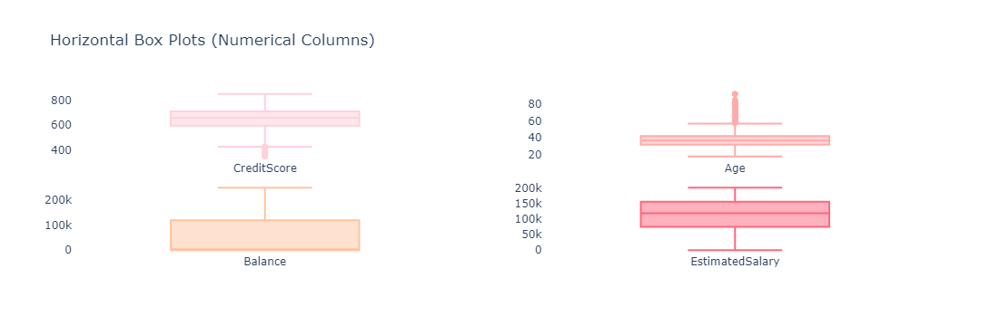

In [42]:
num_cols = ['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

# Create subplots with two rows and two columns
fig = make_subplots(rows=2, cols=2, horizontal_spacing=0.1)

# Background color
fig.update_layout(
    plot_bgcolor="#FFFFFF",  
    paper_bgcolor="#FFFFFF",  
)

# Define pastel color palette
pastel_colors = ['#FFD1DC', '#FFABAB', '#FFC3A0', '#FF677D']

# Loop through numerical columns and add horizontal box plots
for i, col in enumerate(num_cols, start=1):
    row_num = 1 if i <= 2 else 2
    col_num = i if i <= 2 else i - 2
    fig.add_trace(
        go.Box(
            y=df_train[col],  
            name=col,
            marker_color=pastel_colors[i-1],  
            line_color=pastel_colors[i-1]  
        ),
        row=row_num,
        col=col_num
    )

# Update layout for horizontal orientation
fig.update_layout(
    title_text="Horizontal Box Plots (Numerical Columns)",
    showlegend=False
)

# Show the plot
fig.show()


#### 9. Preprocess Data

*At the beginning of the code blocks containing the written codes, the following subheadings will be specified.*

- **9.1 Correlation Matrix**
- **9.2 Numeric Feature Distribution**

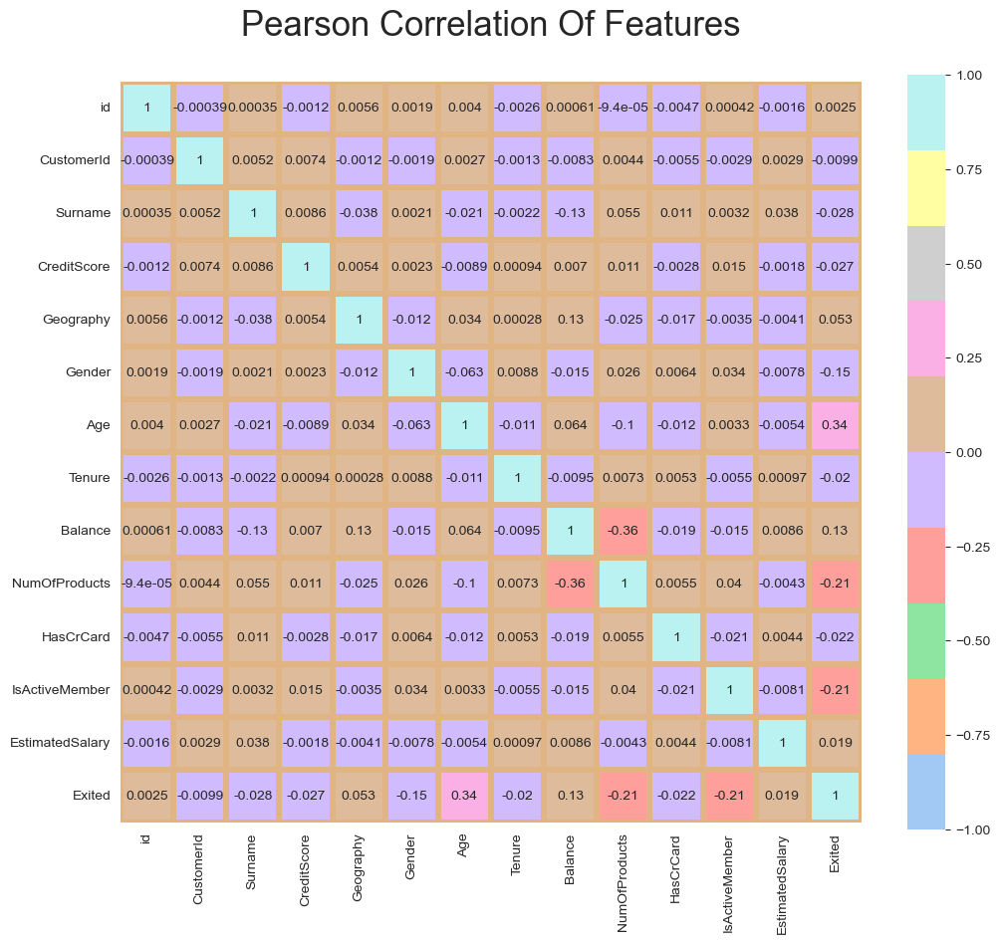

In [44]:
# 9.1 Correlation Matrix

# Checking Corr Matrix 
# Making New Data Frame .
df_corr = df_train.copy()

# Selecting categorical columns and applying Label Encoding
catcol = [col for col in df_corr.columns if df_corr[col].dtype == "object"]
le = LabelEncoder()
for col in catcol:
    df_corr[col] = le.fit_transform(df_corr[col])

# Setting the style and background
sns.set_style("white")  
palette_cmap = sns.color_palette("pastel", as_cmap=True)  

# Creating the heatmap with larger figure size and smaller annotations
plt.subplots(figsize=(12, 12))  

sns.heatmap(df_corr.corr(), cmap=palette_cmap, square=True, cbar_kws=dict(shrink=.82),
            annot=True, vmin=-1, vmax=1, linewidths=3, linecolor='#e0b583', 
            annot_kws=dict(fontsize=10))  

# Setting title and axes
plt.title("Pearson Correlation Of Features\n", fontsize=25)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


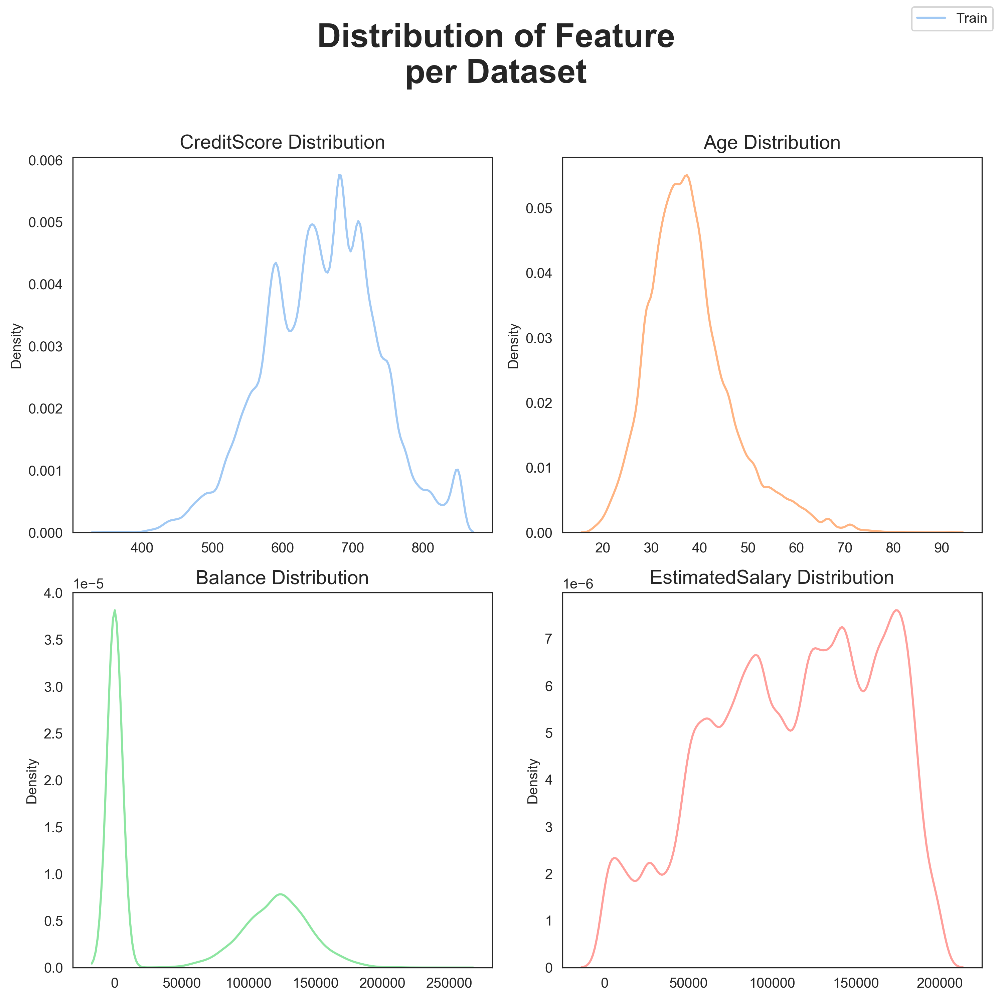

In [45]:
# 9.2 Numeric Feature Distribution

# Set the style to white for a clean background
sns.set_style("white")

# Set pastel color palette for the plots
pastel_palette = sns.color_palette("pastel")

# Create square subplots
fig, ax = plt.subplots(2, 2, figsize=(10, 10), dpi=300)  
ax = ax.flatten()

numerical_variables = ['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

# Loop through the numerical variables and plot their distribution
for i, column in enumerate(numerical_variables):
    sns.kdeplot(df_train[column], ax=ax[i], color=pastel_palette[i % len(pastel_palette)])  
    ax[i].set_title(f'{column} Distribution', size=14)
    ax[i].set_xlabel(None)

# Add a title and legend
fig.suptitle('Distribution of Feature\nper Dataset\n', fontsize=24, fontweight='bold')
fig.legend(['Train'], loc='upper right')

# Adjust the layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()